In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [3]:
# Image completion
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [4]:
# Read in a image from torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


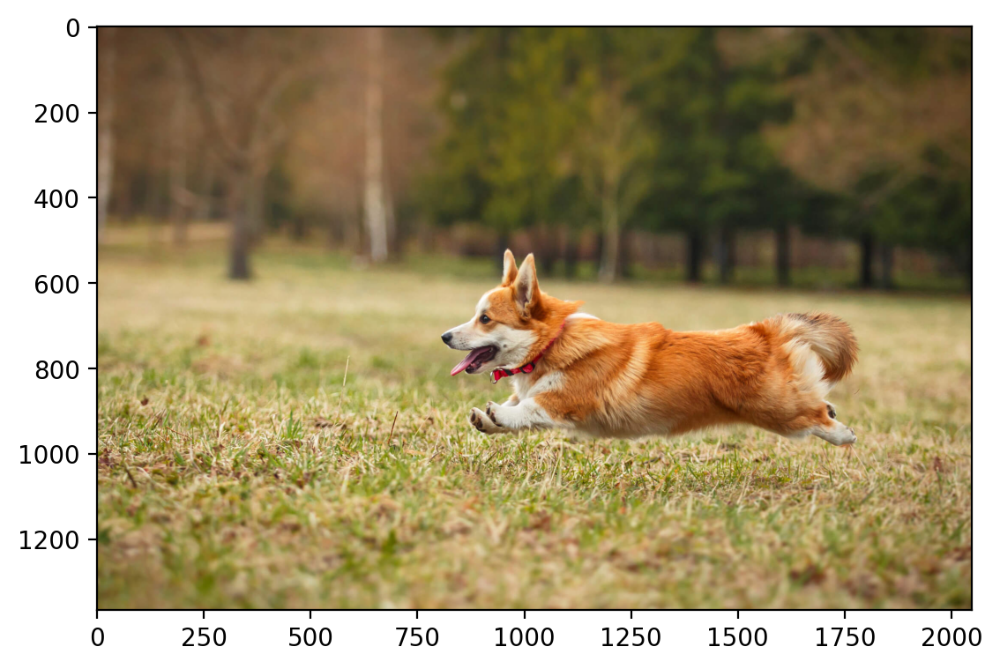

In [5]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

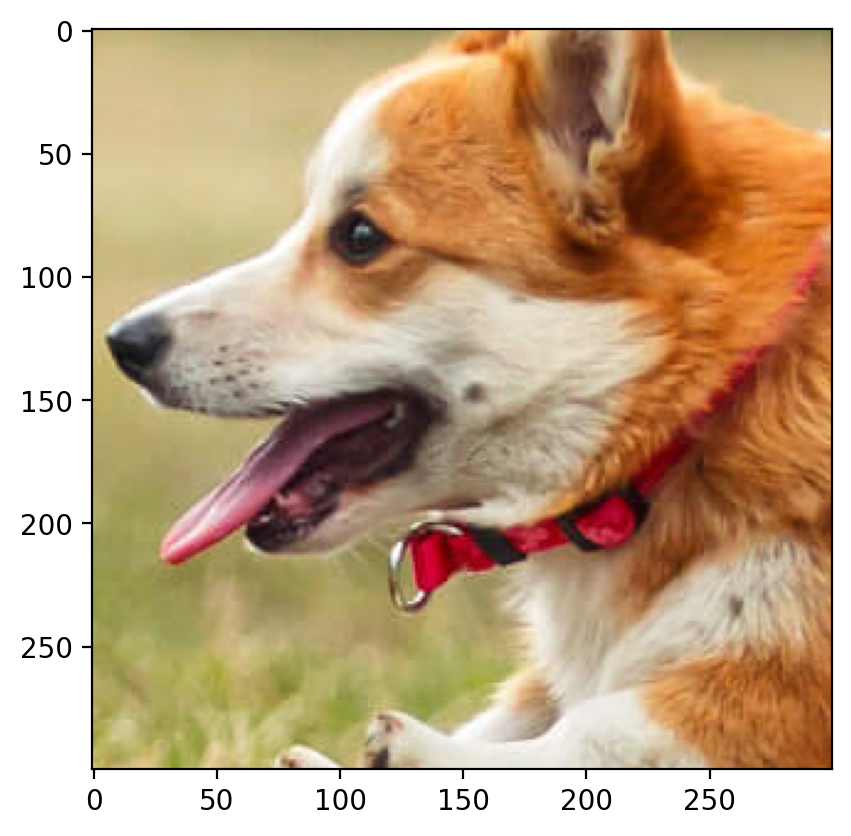

In [6]:
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img
from sklearn.preprocessing import MinMaxScaler
MinMaxScaler()
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device)
img_scaled
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop.shape
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())

In [7]:
original_img = crop.clone()

In [8]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [9]:
dog_X, dog_Y = create_coordinate_map(crop)

dog_X.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [10]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()

In [11]:
dog_X_scaled.shape, dog_Y.shape

(torch.Size([90000, 2]), torch.Size([90000, 3]))

In [12]:
crop.shape

torch.Size([3, 300, 300])

# Creating an unstructured missing region:

In [13]:
import torchvision.transforms.functional as TF
import random

In [14]:
def mask_image(img, prop, mask_size):
    img_copy = img.clone()
    
    # Get the dimensions of the image
    _, h, w = img.shape
    
    # Ensure the mask size is not larger than the image dimensions
    mask_size = min(mask_size, min(h, w))
    
    # Flatten the image and generate indices for the pixels
    flat_indices = torch.arange(h * w)
    
    # Randomly choose indices for the missing pixels
    masked_indices = random.sample(flat_indices.tolist(), mask_size * mask_size)
    
    # Convert the indices to 2D coordinates
    masked_coords = [(idx // w, idx % w) for idx in masked_indices]
    
    # Mask the selected pixels
    for y, x in masked_coords:
        img_copy[:, y, x] = float('nan')
    
    return img_copy


In [15]:
# # Create a new image with a random subset of 900 (30x30) pixels missing
# masked_img = mask_image(crop, 0.3)

# # Display the original and masked images
# fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# # Original image
# axes[0].imshow(crop.permute(1, 2, 0).numpy())
# axes[0].set_title('Original Image')

# # Masked image
# axes[1].imshow(masked_img.permute(1, 2, 0).numpy())
# axes[1].set_title('Image with Randomly Masked Pixels')

# plt.show()

# Matrix Factorization

In [16]:
import torch.optim as optim

In [17]:
# masked_img.shape

In [18]:
# reshaped_tensor = masked_img.reshape(3, -1)

In [19]:
# reshaped_tensor.shape

In [20]:
def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)

    # Randomly initialize A and B for each channel
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)

    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)

    mask = ~torch.isnan(A)

    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward()
        
        # Update the parameters
        optimizer.step()
        
    return W, H, loss


### Error Calculations

In [21]:
Errors={'Type':[],'RMSE': [],'Peak SNR':[]}

### Plotting original and reconstructed images

In [22]:
def plot_reconstructed_and_original_image(original_img, masked_img, finalImg, mask_size, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    fig = plt.figure(figsize=(10, 6))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax2 = plt.subplot(gs[2])

    ax0.imshow(rearrange(original_img, 'c h w -> h w c').cpu().detach().numpy())
    ax0.set_title("Original Image")

    ax1.imshow(rearrange(masked_img, 'c h w -> h w c').cpu().detach().numpy())
    ax1.set_title(f"Image with missing pixels")

    ax2.imshow(rearrange(finalImg, 'c h w -> h w c').cpu().detach().numpy())
    ax2.set_title(f"Reconstructed Image (Mask Size: {mask_size})")

    squared_error = torch.square(rearrange(finalImg, 'c h w -> h w c').cpu() - rearrange(original_img, 'c h w -> h w c').cpu())
    mse = torch.mean(squared_error)

    # Calculate the root mean squared error
    rmse = torch.sqrt(mse)

    # Calculate the peak signal value (assuming the vectors are in the range [0, 1])
    max_val = 1.0
    psnr = 10 * torch.log10(max_val / rmse)

    Errors["Type"].append(title)
    Errors["RMSE"].append(rmse.cpu().detach().numpy())
    Errors["Peak SNR"].append(psnr.cpu().detach().numpy())
    print(f"Type: {title}, Mask Size: {mask_size}, RMSE: {rmse}, PSNR: {psnr}\n")

    # Calculate the PSNR
    for a in [ax0, ax1, ax2]:
        a.axis("off")

    fig.suptitle(title, y=0.9)
    plt.tight_layout()

## Training and Plotting Reconstructed vs Original images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image, Mask Size: 20, RMSE: 0.031619275665037624, PSNR: 15.000480831160274



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image, Mask Size: 30, RMSE: 0.03153738092996322, PSNR: 15.01174376159111



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image, Mask Size: 40, RMSE: 0.031854788917005605, PSNR: 14.968252683871013



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image, Mask Size: 60, RMSE: 0.03247679962177765, PSNR: 14.884267742302114



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image, Mask Size: 80, RMSE: 0.03325806504769815, PSNR: 14.78103021609356

ErrorDF:                                                  Type                  RMSE  \
0  Reconstructed Image for a random subset of pix...  0.031619275665037624   
1  Reconstructed Image for a random subset of pix...   0.03153738092996322   
2  Reconstructed Image for a random subset of pix...  0.031854788917005605   
3  Reconstructed Image for a random subset of pix...   0.03247679962177765   
4  Reconstructed Image for a random subset of pix...   0.03325806504769815   

             Peak SNR  
0  15.000480831160274  
1   15.01174376159111  
2  14.968252683871013  
3  14.884267742302114  
4   14.78103021609356  


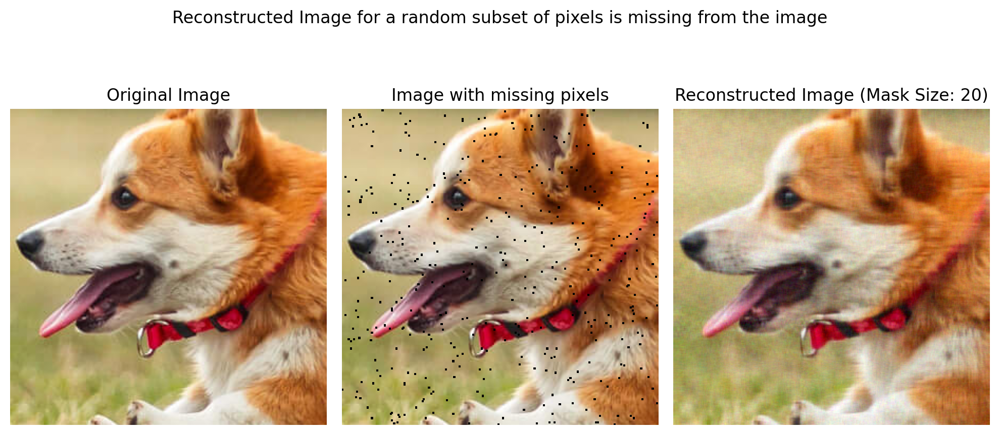

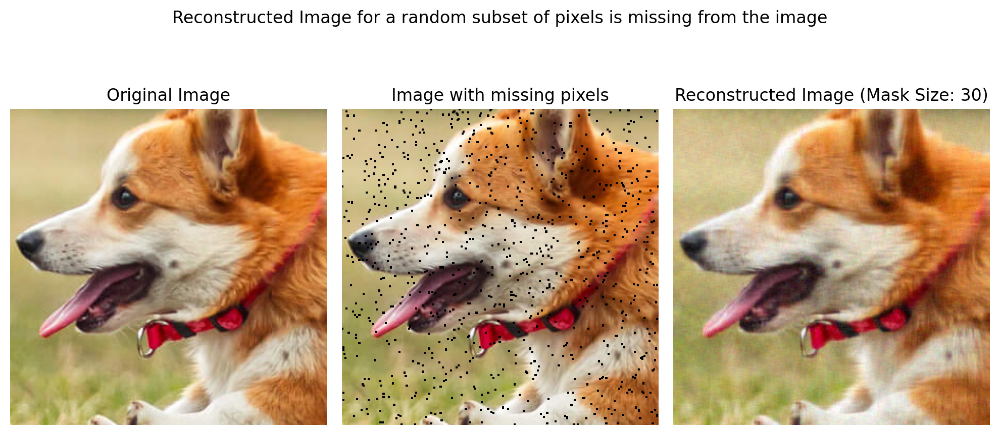

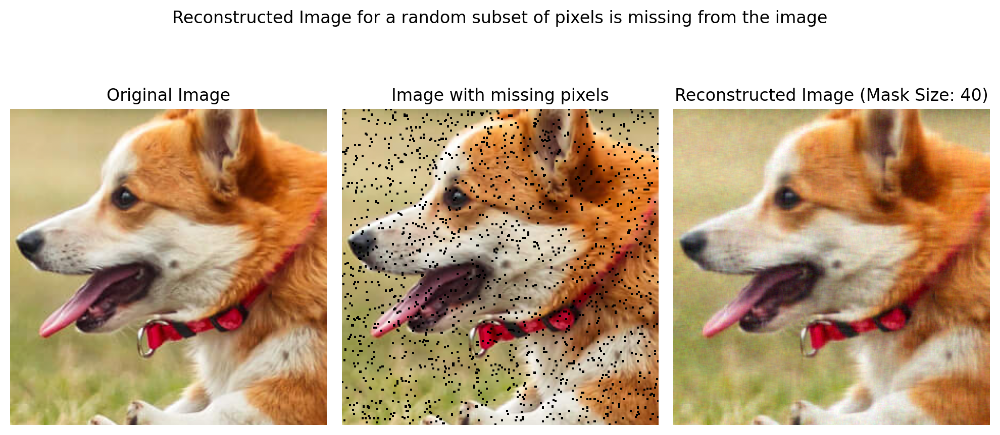

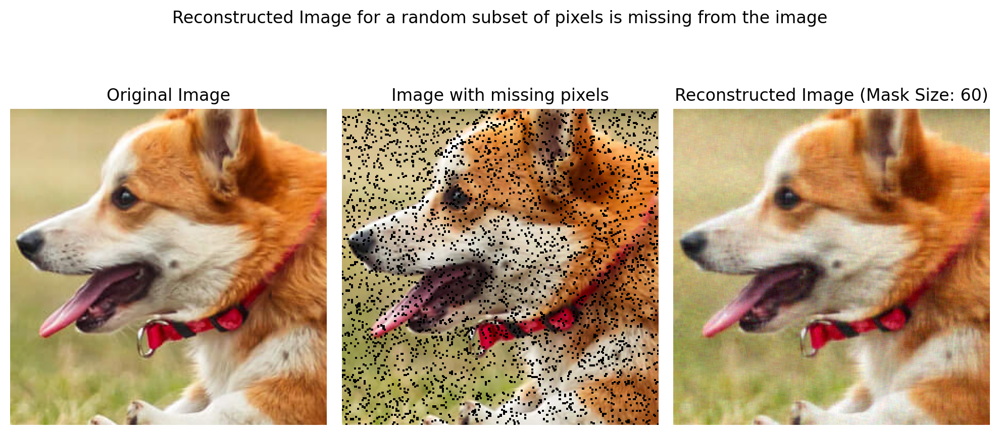

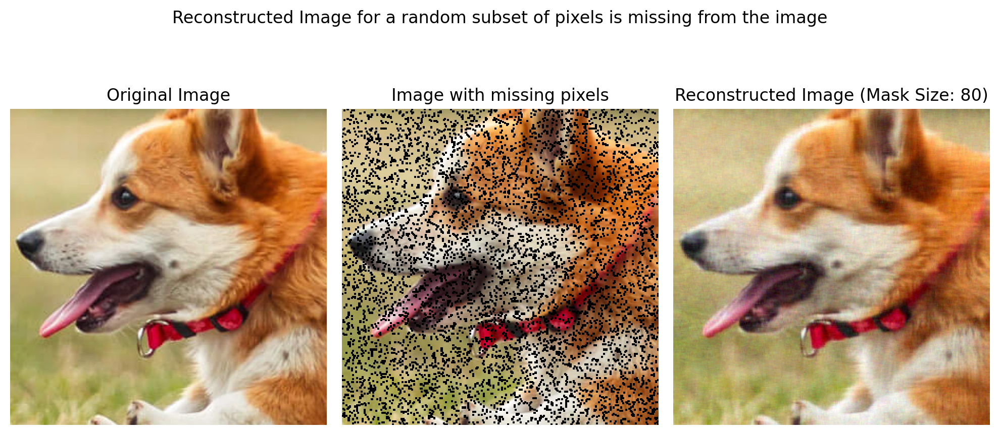

In [23]:
mask_size = [20, 30, 40, 60, 80]
label = ["a random subset of pixels is missing from the image"] * len(mask_size)

for idx, ms in enumerate(mask_size):
    masked_image = mask_image(crop, 1, ms)
    Wr, Hr, lossr = factorize(masked_image[0], 100, device=device)
    Wg, Hg, lossr = factorize(masked_image[1], 100, device=device)
    wb, Hb, lossr = factorize(masked_image[2], 100, device=device)
    finalImg = torch.Tensor(3, 300, 300)
    finalImg[0] = torch.mm(Wr, Hr)
    finalImg[1] = torch.mm(Wg, Hg)
    finalImg[2] = torch.mm(wb, Hb)
    plot_reconstructed_and_original_image(crop, masked_image, finalImg, ms, title=f"Reconstructed Image for {label[idx]}")

ErrorDF = pd.DataFrame(Errors)
ErrorDF.reset_index(drop=True, inplace=True)

print("ErrorDF: ", ErrorDF)

# Linear+rff

In [24]:
import torch.nn as nn

In [25]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.linear(x)

In [26]:
# create RFF features
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [27]:
def train(net, lr, X, Y, epochs, batch_size=32, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    epochs: int
    batch_size: int, default=32
    verbose: bool, default=True
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)

    num_samples = X.shape[0]
    num_batches = (num_samples + batch_size - 1) // batch_size

    for epoch in range(epochs):
        running_loss = 0.0
        for i in range(num_batches):
            optimizer.zero_grad()
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, num_samples)
            batch_X = X[start_idx:end_idx]
            batch_Y = Y[start_idx:end_idx]
            outputs = net(batch_X)
            loss = criterion(outputs, batch_Y)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {running_loss / num_batches:.6f}")


In [28]:
# dog_X_masked, dog_Y_masked = create_coordinate_map(masked_img)

# dog_X_masked.shape, dog_Y_masked.shape

# # MinMaxScaler from -1 to 1
# scaler_X_masked = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X_masked.cpu())

# # Scale the X coordinates
# dog_X_scaled_masked = scaler_X.transform(dog_X_masked.cpu())

# # Move the scaled X coordinates to the GPU
# dog_X_scaled_masked = torch.tensor(dog_X_scaled_masked).to(device)

# # Set to dtype float32
# dog_X_scaled_masked = dog_X_scaled_masked.float()

In [29]:
# dog_X_scaled_masked.shape

In [30]:
# dog_Y.shape

In [31]:
Errors_rff={'Type':[],'RMSE': [],'Peak SNR':[]}

In [32]:
def plot_reconstructed_and_original_image_RFF(original_img, net, X,maskedImage, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(300, 300, 3)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1,1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])
    ax2 = plt.subplot(gs[2])

    ax2.set_title(f"Reconstucted Image")
    ax2.imshow(outputs.cpu())
    ax0.set_title("Original Image")
    ax0.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Image with missing block")
    ax1.imshow(maskedImage.reshape(300,300,3).cpu().numpy())
    

    squared_error = torch.square(outputs.cpu() - original_img.cpu().permute(1,2,0))
    mse = torch.mean(squared_error)


    # Calculate the root mean squared error
    rmse = torch.sqrt(mse)

    # Calculate the peak signal value (assuming the vectors are in the range [0, 1])
    max_val = 1.0
    psnr = 10 * torch.log10(max_val / rmse)
    Errors_rff["Type"].append(title)
    Errors_rff["RMSE"].append(rmse.cpu().detach().numpy())
    Errors_rff["Peak SNR"].append(psnr.cpu().detach().numpy())
    print(f"Type: {title} , RMSE: {rmse}, PSNR: {psnr} \n")

# Calculate the PSNR
    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

### Training - linear rff

In [33]:
# Example code to calculate the number of elements in the flattened mask tensor
h, w, c = 300, 300, 3  # Assuming a 3-channel image with dimensions 300x300
maskedImage_shape = (h * w, c)

# Creating a sample maskedImage tensor
maskedImage = torch.rand(maskedImage_shape)

# Creating a binary mask tensor
mask = ~torch.isnan(maskedImage)

# Calculating the total number of elements in the flattened mask tensor
total_elements = int(np.prod(mask.shape))
print("Total elements in flattened mask tensor:", total_elements)


Total elements in flattened mask tensor: 270000


def train(net, lr, X, Y, epochs, batch_size=32, verbose=True):

Epoch 0 loss: 0.036492


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image , RMSE: 0.06302041564456502, PSNR: 12.005187368087068 

Epoch 0 loss: 0.035717


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image , RMSE: 0.040654202606385914, PSNR: 13.908945527901631 

Epoch 0 loss: 0.034338


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image , RMSE: 0.04798892097638924, PSNR: 13.188590150033635 

Epoch 0 loss: 0.036258


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image , RMSE: 0.07228371752640182, PSNR: 11.40959519922875 

Epoch 0 loss: 0.035092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Type: Reconstructed Image for a random subset of pixels is missing from the image , RMSE: 0.061615053519268624, PSNR: 12.103131699514787 

ErrorDF_RFF:                                                  Type                  RMSE  \
0  Reconstructed Image for a random subset of pix...   0.06302041564456502   
1  Reconstructed Image for a random subset of pix...  0.040654202606385914   
2  Reconstructed Image for a random subset of pix...   0.04798892097638924   
3  Reconstructed Image for a random subset of pix...   0.07228371752640182   
4  Reconstructed Image for a random subset of pix...  0.061615053519268624   

             Peak SNR  
0  12.005187368087068  
1  13.908945527901631  
2  13.188590150033635  
3   11.40959519922875  
4  12.103131699514787  


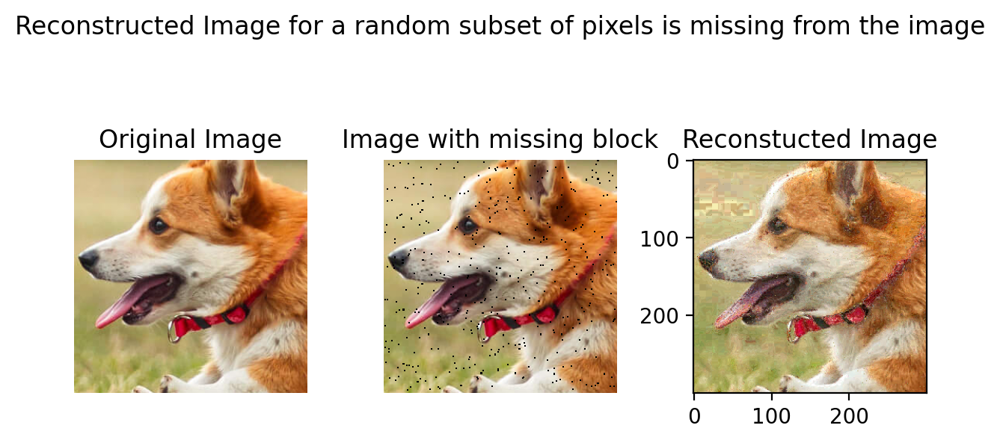

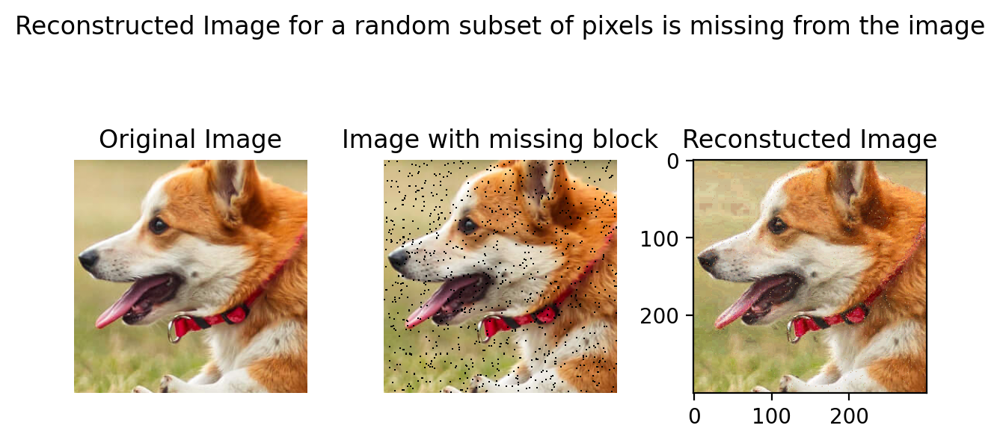

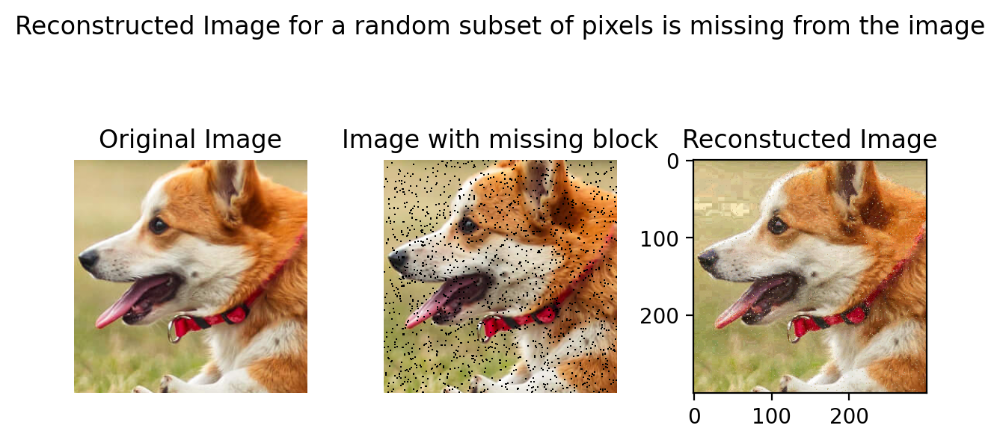

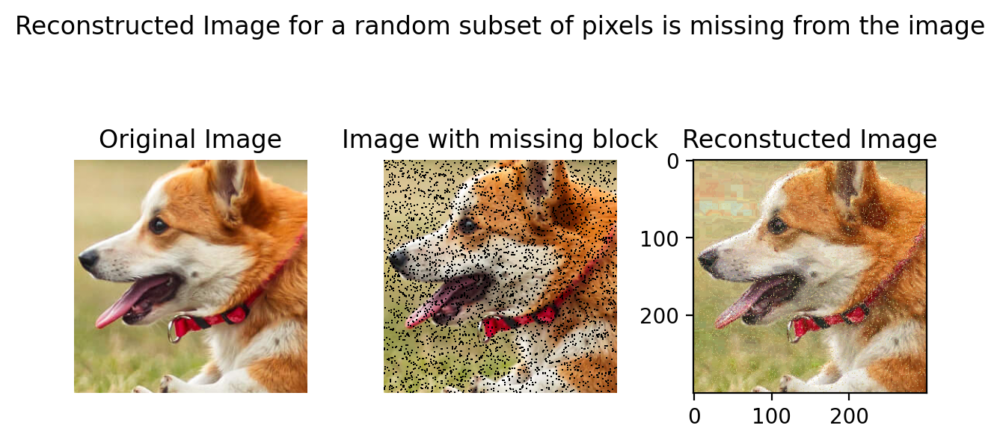

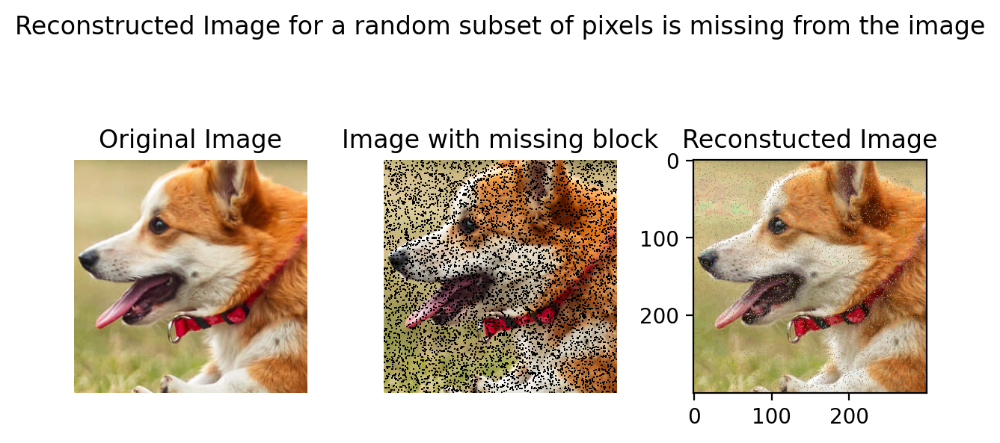

In [34]:
mask_size = [20, 30, 40, 60, 80]
label = ["a random subset of pixels is missing from the image"] * len(mask_size)

crop_ = rearrange(crop, 'c h w -> (h w) c').float()
crop_=torch.tensor(crop_,dtype=torch.float32).to(device)
for idx, ms in enumerate(mask_size):
    masked_image = mask_image(crop, 1, ms)
    maskedImage= rearrange(masked_image,'c h w -> (h w) c').float()
    mask = ~torch.isnan(maskedImage)
    mmMask=mask.cpu().numpy().reshape(270000,1)
    mmImage=maskedImage.cpu().numpy().reshape(270000,1)
    mmImage[mmMask==False]=np.random.uniform(0,1)
    mmImage=torch.tensor(mmImage.reshape(90000,3),dtype=torch.float32).to(device)
    X_rff = create_rff_features(mmImage, 10000, 0.008)
    net = LinearModel(X_rff.shape[1], 3)
    net.to(device)
    train(net, 0.005, X_rff,crop_, 100,100,True)
    plot_reconstructed_and_original_image_RFF(crop, net, X_rff,maskedImage, title=f"Reconstructed Image for {label[idx]}")

ErrorDF_RFF=pd.DataFrame(Errors_rff)
ErrorDF_RFF.reset_index(drop=True, inplace=True)

print("ErrorDF_RFF: ",ErrorDF_RFF)